# Monopoly-alt

## Description:

*Monopoly-alt is a real-estate board game for two players. The player's goal is to buy as many properties and place as many real-estate as possible.*

### In-game items:
- dice - white cube with black dots on each side 
- counters - two cones with different colors which represent players
- cards - represent the properties a player owns
- board
- houses - green structures representing real estate

### Events:
- rolling the dice
- buying property
- moving a counter
- placing real estate
- selling property for mortgage

## Dataset

Dataset is organized into two folders depending on the resolution

```
/quality_480/
/quality_1080/
```

Inside each folder there are video files of format

```
<expected_grade>_<difficulty>.mp4
```


In [1]:
# Import libraries
from PIL.ExifTags import TAGS
from PIL import Image
from ipywidgets import Video
from pprint import pprint
import random
import glob
import sys
import os
import PIL
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utilities import *
%matplotlib inline


### Grade 3

#### Detection

- dice
- counter

#### Tracking

- counter

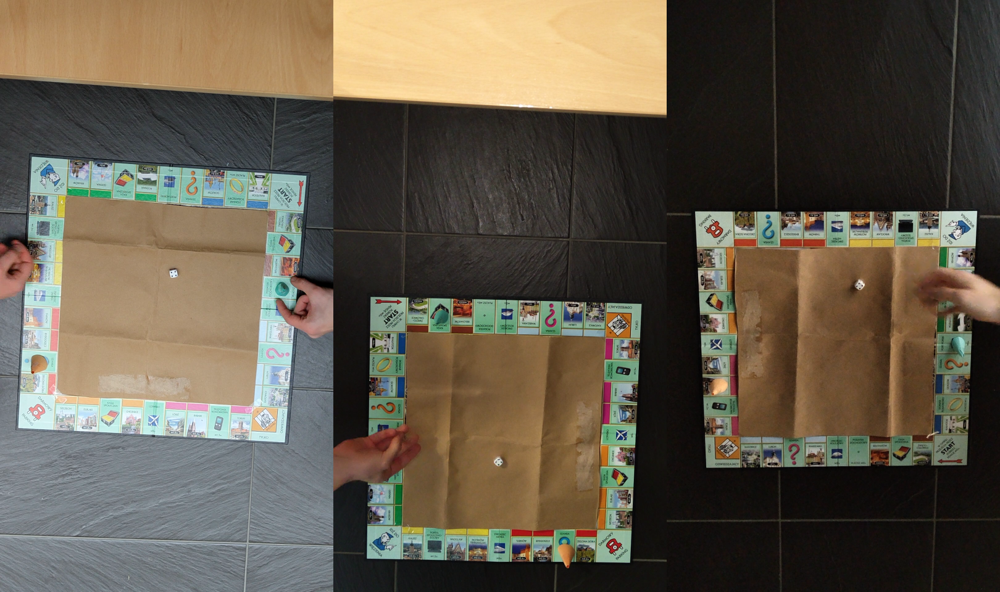

In [15]:
cap_e = cv2.VideoCapture("quality_1080/3_easy_2.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/3_medium.mp4")
cap_m.set(1, 30*15)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
cap_h.set(1, 30*15)
_, frame_h = cap_h.read()
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


### Grade 4


#### Events

- buying property
- moving a counter

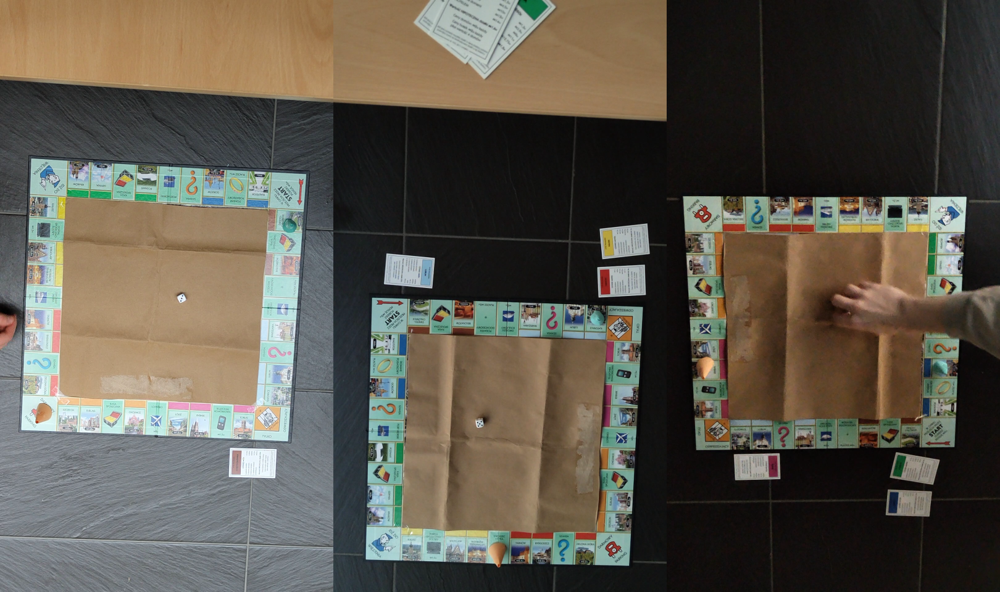

In [20]:
cap_e = cv2.VideoCapture("quality_1080/4_cards_easy.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/4_cards_medium.mp4")
cap_m.set(1, 30*29)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/4_cards_hard.mp4")
cap_h.set(1, 30*23)
_, frame_h = cap_h.read()
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


### Grade 5

#### Events

- buying property
- moving counter
- placing real-estate
- selling mortgage
- rolling the dice

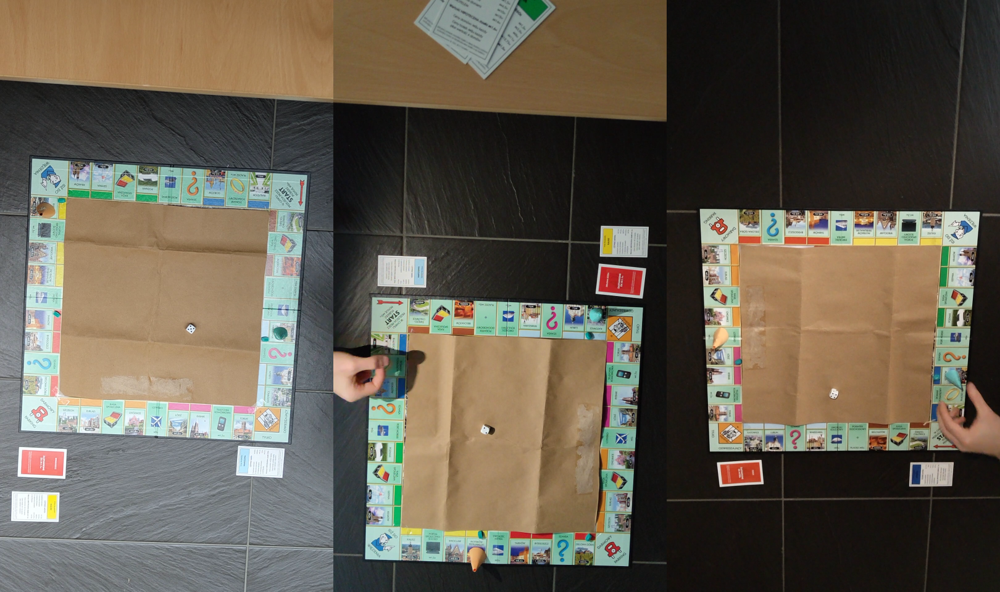

In [33]:
cap_e = cv2.VideoCapture("quality_1080/5_easy.mp4")
cap_e.set(1, 30*49)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/5_medium.mp4")
cap_m.set(1, 30*48)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/5_hard.mp4")
cap_h.set(1, 30*30)
_, frame_h = cap_h.read()
frame_h = cv2.rotate(frame_h, cv2.ROTATE_90_CLOCKWISE)
imshow(cv2.resize(np.concatenate(
    [frame_e, frame_m, frame_h], axis=1), (0, 0), fx=0.5, fy=0.5))


## Grade 3

In [44]:
def show_frames(frames):
    imshow(cv2.resize(np.concatenate(frames, axis=1), (0, 0), fx=0.5, fy=0.5))


In [11]:
cap_e = cv2.VideoCapture("quality_1080/3_easy_2.mp4")
cap_e.set(1, 30*1)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/3_medium.mp4")
cap_m.set(1, 30*1)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
cap_h.set(1, 30*1)
_, frame_h = cap_h.read()
frames = frame_e, frame_m, frame_h


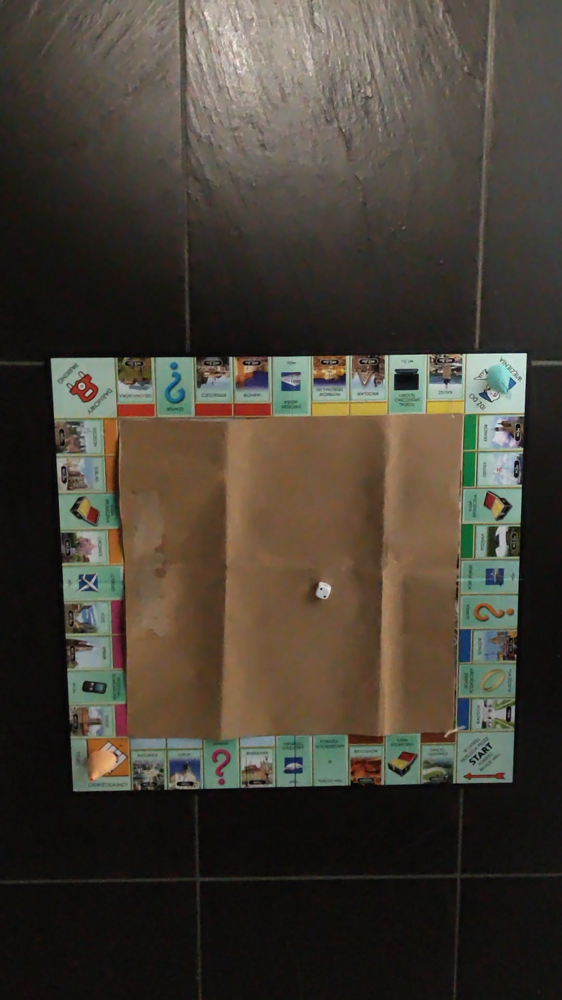

In [12]:
imshow(frame_h)

#### Utilities

In [3]:
# cuts image to only show contour, warp if you want to match the contour with rotation
def cut_bbox(frame, contour, warp=True):
    if warp:
        rect = cv2.minAreaRect(contour)

        box = cv2.boxPoints(rect)
        box = np.int0(box)

        # get width and height of the detected rectangle
        width = int(rect[1][0])
        height = int(rect[1][1])

        src_pts = box.astype("float32")
        # coordinate of the points in box points after the rectangle has been
        # straightened
        dst_pts = np.array([[0, height-1],
                            [0, 0],
                            [width-1, 0],
                            [width-1, height-1]], dtype="float32")

        # the perspective transformation matrix
        M = cv2.getPerspectiveTransform(src_pts, dst_pts)

        # directly warp the rotated rectangle to get the straightened rectangle
        return cv2.warpPerspective(frame, M, (width, height))
    else:
        rect = cv2.boundingRect(contour)
        return frame[rect[1]:rect[1]+rect[3], rect[0]:rect[0]+rect[2]]


In [4]:
def draw_bbox(frame, bbox, color=(255, 255, 255)):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, color, 2, 1)


In [5]:
def mask_color(img,lower,upper):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return cv2.inRange(hsv, lower, upper)

In [6]:
def find_color_bounds(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return np.min(hsv, axis=(0, 1)), np.max(hsv, axis=(0, 1))
    

In [7]:
def draw_rectangle_from_contours(source_img,contours):
    drawing = source_img.copy()
    for i in range(len(contours)):
        
        rect = cv2.minAreaRect(contours[i])
        box = cv2.boxPoints(rect)
        box = np.int0(box)

        cv2.drawContours(drawing, [box], 0, (0, 0, 255), 2)
    return drawing

### Dice detection

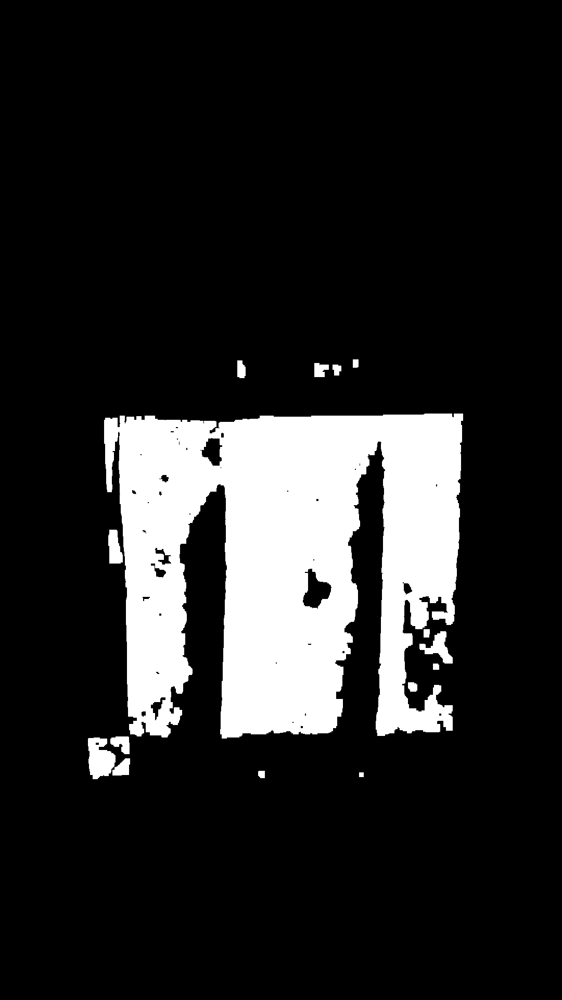

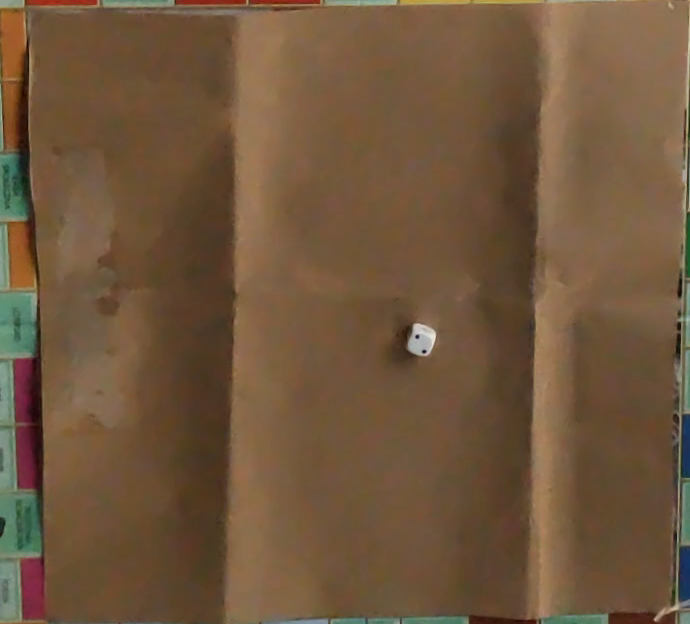

In [13]:
# Find approximate region of the center of the board
def find_center_space(frame):

    lower = np.array([9, 80, 100], np.uint8)
    upper = np.array([19, 210, 235], np.uint8)
    mask = mask_color(frame, lower, upper)
    

    new = cv2.morphologyEx(mask,cv2.MORPH_OPEN,np.ones((9,9)))
    contours, _ = cv2.findContours(
        new, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for c in contours:

        area = cv2.contourArea(c)
        if area > 22000:
            return new,c
    return new,None


mask, contour = find_center_space(frame_h)
space = cut_bbox(frame_h, contour, False)
imshow(mask)
imshow(space)


In [14]:
def check_box_inside_contour(box, contour):
    rect = cv2.boundingRect(contour)
    return box[0] > rect[0] and box[1] > rect[1] and box[0] + box[2] < rect[0] + rect[2]  and box[1] + box[3] < rect[1] + rect[3]

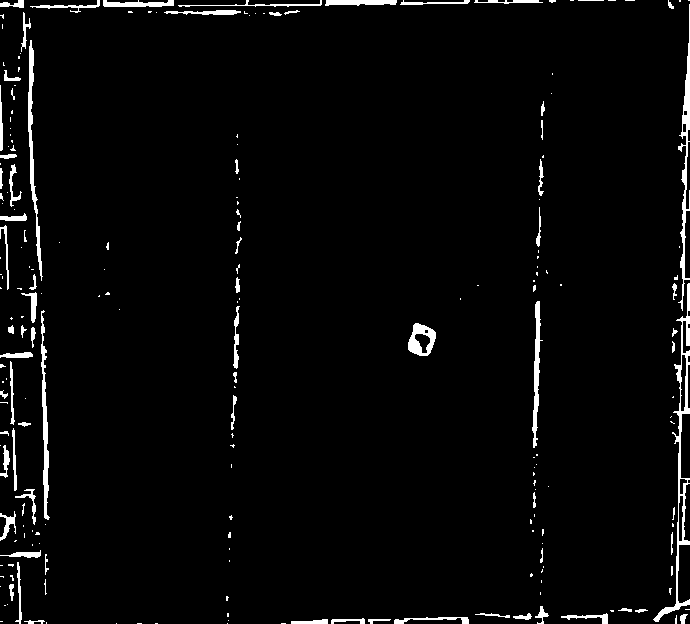

In [15]:
def find_white(frame,lightness_threshold = 190):
    lightness_channel = cv2.cvtColor(frame, cv2.COLOR_BGR2HLS)[:,:,1]
    #imshow(lightness_channel)
    threshed = cv2.adaptiveThreshold(lightness_channel,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,15,-11)
    threshed = cv2.morphologyEx(threshed,cv2.MORPH_CLOSE,np.ones((3,3)))
    #th, threshed = cv2.threshold(
     #   lightness_channel, lightness_threshold, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return threshed
imshow(find_white(space))

dice must be inside the center of the board

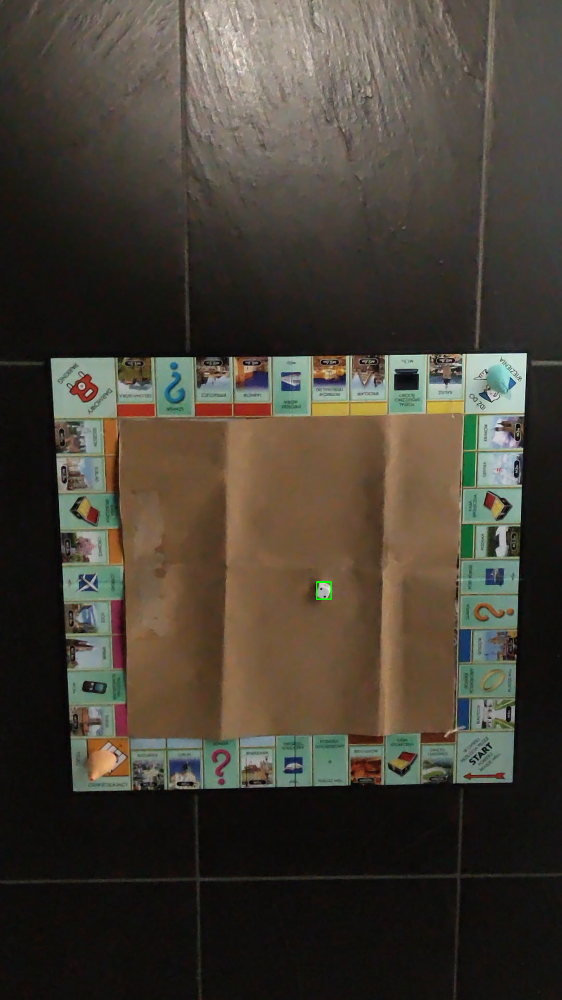

In [16]:
def find_possible_dice_positions(frame, rectangle):
    threshed = find_white(frame)
    
    contours, _ = cv2.findContours(
        threshed, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    new_c = []
    for c in contours:
        
        rect = cv2.boundingRect(c)
        area = rect[2] * rect[3]
        if 1200 > area > 600 and abs(rect[2]/rect[3] - 1) < 0.2:  # certain size and near square
            if check_box_inside_contour(rect,rectangle):
                new_c.append(rect)
    return new_c


boxes = find_possible_dice_positions(frame_h,contour)
draw = frame_h.copy()
for bbox in boxes:
    draw_bbox(draw, bbox, (0, 255, 0))
imshow(draw)


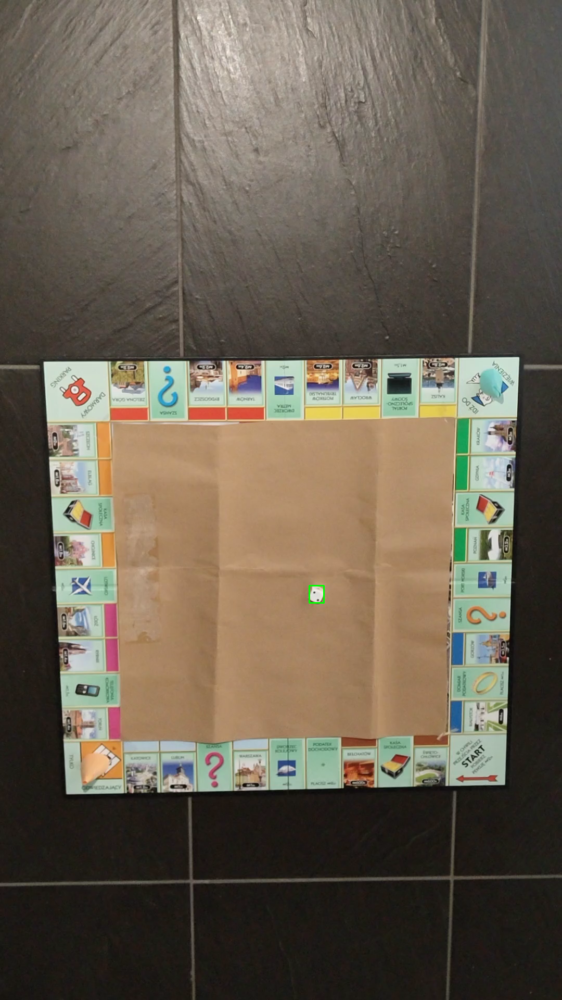

In [17]:
cap_h = cv2.VideoCapture("quality_1080/3_hard.mp4")
i = 0

CALIBRATION_PERIOD = 1
while (True):
    #
    _, frame_h = cap_h.read()
    i+=1
    drawing = frame_h.copy()
    if i == CALIBRATION_PERIOD: #since camera moves only slightly, we can use the same center for the whole video
        _, contour = find_center_space(frame_h)
    if contour is not None:
        boxes = find_possible_dice_positions(frame_h,contour)
        
        for bbox in boxes:
            draw_bbox(drawing, bbox, (0, 255, 0))
    if i == CALIBRATION_PERIOD:
        imshow(drawing)
    
    cv2.imshow('frame', cv2.resize(drawing,(480,900)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break


### Counter detection

In [ ]:
#todo

### Counter tracking

In [36]:
# todo


## Grade 4

In [18]:
def draw_card_frame(frame,cards):
    new_frame = draw_rectangle_from_contours(frame, cards)

    return new_frame

### Buying a property (placing a card)
### Mortgages

In [19]:
cap_e = cv2.VideoCapture("quality_1080/4_cards_easy.mp4")
cap_e.set(1, 30*15)
_, frame_e = cap_e.read()
cap_m = cv2.VideoCapture("quality_1080/4_cards_medium.mp4")
cap_m.set(1, 30*29)
_, frame_m = cap_m.read()
cap_h = cv2.VideoCapture("quality_1080/4_cards_hard.mp4")
cap_h.set(1, 30*23)
_, frame_h = cap_h.read()

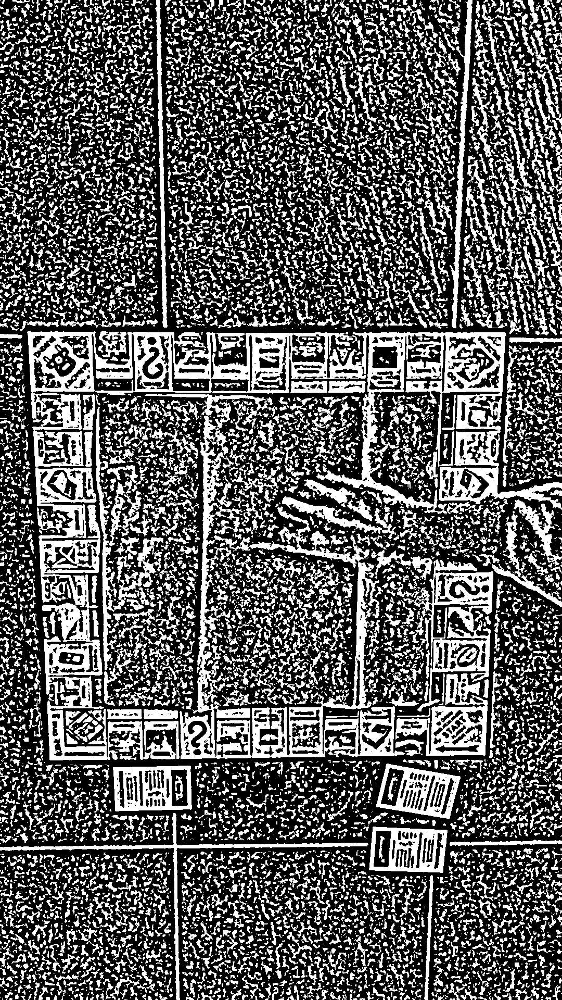

In [20]:
def cards_threshold(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    threshed = cv2.adaptiveThreshold(cv2.blur(gray, (3, 3)), 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                     cv2.THRESH_BINARY, 15, 0)
    return threshed
imshow(cards_threshold(frame_h))

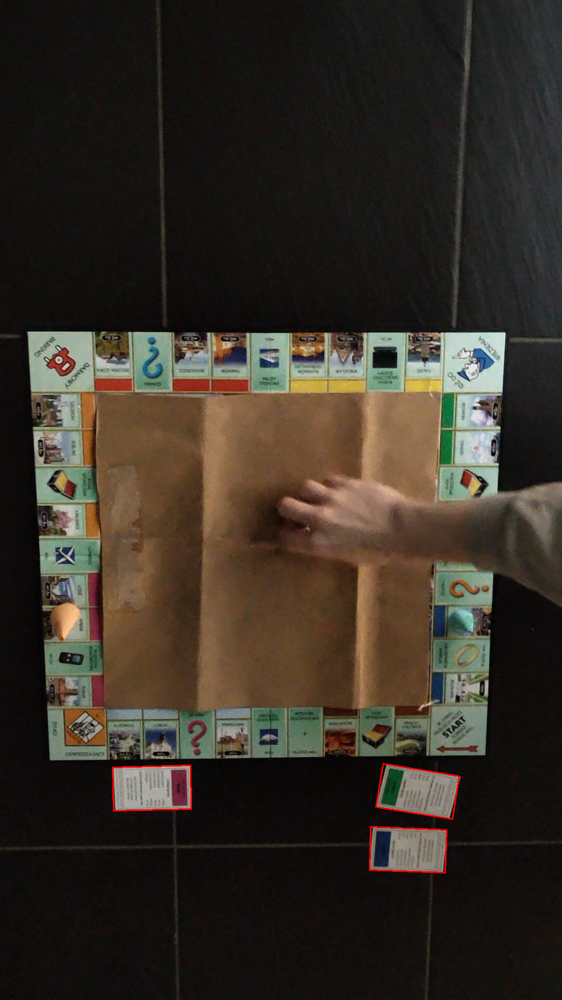

In [21]:
def find_cards(frame):
    threshed = cards_threshold(frame)
    contours, hierarchy = cv2.findContours(
        threshed, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE,)

    MIN_AREA = 8000 # scales with resolution
    MAX_AREA = 20000 # scales with resolution
    cards = []
    CARD_ASPECT = 0.58
    ASPECT_SENSITIVITY = 0.1
    ARC_DIFFERENCE_SENSITIVITY = 100 # scales with resolution
    for c, h in zip(contours, hierarchy[0]):

        area = cv2.contourArea(c)
        approx = cv2.approxPolyDP(c, 0.05*cv2.arcLength(c, True), True)
        convexHull = cv2.convexHull(approx)

        if h[3] == -1 and len(approx) == 4 and MAX_AREA > area > MIN_AREA:
            #print(area)
            try:
                convexityDefects = cv2.convexityDefects(
                    approx, cv2.convexHull(approx, returnPoints=False))
                if convexityDefects:
                    continue
            except:
                continue

            rect = cv2.minAreaRect(c)

            # get width and height of the detected rectangle
            width = int(rect[1][0])
            height = int(rect[1][1])

            if abs(cv2.arcLength(c, True) - (width*2+height*2)) < ARC_DIFFERENCE_SENSITIVITY:

                # if its aspect ratio is more or less the card ratio xD
                if abs(width/height - CARD_ASPECT) < ASPECT_SENSITIVITY or abs(height/width - CARD_ASPECT) < ASPECT_SENSITIVITY:
                    cards.append(approx)
    return cards

cards = find_cards(frame_h)
imshow(draw_card_frame(frame_h, cards))

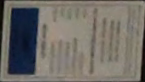

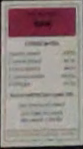

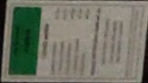

In [22]:
def get_cards_images(frame,cards):
    card_images = []
    for card in cards:
        card_image = cut_bbox(frame,card)
        card_images.append(card_image)
    return(card_images)
cards_images = get_cards_images(frame_h,cards)
for card in cards_images:
    imshow(card)

In [23]:
from sklearn.cluster import KMeans
from collections import Counter
def get_dominant_color(image, k=2, image_processing_size = None):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:,:,:]
    #reshape the image to be a list of pixels
    image = image.reshape((image.shape[0] * image.shape[1], 3))

    #cluster and assign labels to the pixels 
    clt = KMeans(n_clusters = k)
    labels = clt.fit_predict(image)

    #count labels to find most popular
    label_counts = Counter(labels)

    #subset out most popular centroid
    h = label_counts.most_common(2)
    
    first = clt.cluster_centers_[h[0][0]]
    second= clt.cluster_centers_[h[1][0]]
   # print(clt.cluster_centers_)

    return [first,second]

In [24]:
# https://stackoverflow.com/questions/2566412/find-nearest-value-in-numpy-array
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    if abs(array[idx] - value) < 20:

        return array[idx], idx
    idx = (np.abs(array - value)).argmax() # hsv is a circle
    if abs(array[idx] - value) > 170:

        return array[idx], idx
    return None, None

In [25]:
class CardController():
    cards = []
    mortgaged_count = 0
    def __init__(self):
        self.cards = []
        self.mortgaged_count = 0
    def update(self,new_cards):
        if len(new_cards) != len(self.cards):
            return self.find_diffs(new_cards)
    def find_diffs(self,new_cards):
        count = 0 #count of mortgaged cards this update
        for card in new_cards:
            color1, color2 = get_dominant_color(card)
            #print(color1,color2)
            if len(self.cards) > 0:
                nearest,idx = find_nearest(self.cards,color2[0])
                if nearest is None:
                    if color1[0] < 20 and color1[1] > 100: # high saturation red
                        count +=1
                    else:
                        self.cards.append(color2[0])
                     #   print(self.cards, color)
                        return f"New card placed!"
                else:
                        self.cards[idx] = color2[0] # update color, heuristic that the color won't change drastically between frames
            else:
                self.cards.append(color2[0])
                #print(self.cards, color)
                return f"New card placed!"
        if self.mortgaged_count < count:
            self.mortgaged_count = count
            return f"Card mortgaged!"
        #self.cards = means
        #print(means)


In [27]:
mvideo = cv2.VideoCapture('quality_1080/4_cards_hard.mp4')
mvideo.set(1, 30*0)
card_controller = CardController()
i=0
EVENT_LENGTH = 7
last_event = -3
event = None
while (True):
    # Grab the latest image from the video feed
    ret, frame = mvideo.read()
    ret, frame = mvideo.read()
    ret, frame = mvideo.read()
    i+=1
    frame = frame  # [500:]
    cards = find_cards(frame)

    drawing = draw_card_frame(frame, cards)


    cards_images = get_cards_images(frame,cards)
    e = card_controller.update(cards_images)
    if e is not None:
        last_event = i
        event = e
        print(event)
        # if len(card_controller.cards) == 3:
        #     imshow(frame)
        #     break
    if last_event + EVENT_LENGTH > i:
        cv2.putText(drawing, event, (10, 100),
            cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)

    cv2.imshow('frame', cv2.resize(drawing,(480,200)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break

New card placed!
New card placed!
New card placed!


error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


### Moving a counter

## Grade 5

### Placing real estate

In [39]:
# todo


### Rolling the dice

In [53]:
def distance_between_boxes(box1,box2):
    return (box1[0] + box1[2]/2 - box2[0] - box1[2]/2)**2 + (box1[1] + box1[3]/2 - box2[1] - box1[3]/2)**2

distance_between_boxes((0,0,4,4),(4,4,4,4))

32.0

In [70]:
def approximate_cvbbox(box, more=5):
    x = box[0] - more
    y = box[1] - more
    w = box[2] + more
    h = box[3] + more

    return (x, y, w, h)


In [74]:
cap_h = cv2.VideoCapture("quality_1080/5_hard.mp4")
i = 0

tracker =cv2.legacy_TrackerTLD.create()

CALIBRATION_PERIOD = 1
STABLE_PERIOD = 10
ROLL_EPSILON = 100000
STABLE_EPSILON = 1000
EVENT_LENGTH = 5
last_box = None
distances = []
stable_counter = 0
rolling = False
last_event = 0
while (True):
    #
    _, frame_h = cap_h.read()
    #_, frame_h = cap_h.read()
    _, frame_h = cap_h.read()
    i+=1
    drawing = frame_h.copy()
    if i == CALIBRATION_PERIOD: #since camera moves only slightly, we can use the same center for the whole video
        _, contour = find_center_space(frame_h)
        if contour is not None:
            boxes = find_possible_dice_positions(frame_h,contour)
            if len(boxes) == 0:
                CALIBRATION_PERIOD+=1
                continue
            last_box = boxes[0]
            draw_bbox(drawing,boxes[0], (0, 255, 0))
            ok = tracker.init(frame_h, approximate_cvbbox(boxes[0],25))
        
    # if i == CALIBRATION_PERIOD:
    #     imshow(drawing)
    if i > CALIBRATION_PERIOD:
        ok,new_box = tracker.update(frame_h)
        distance = distance_between_boxes(last_box, new_box)
        if distance > ROLL_EPSILON:
            rolling = True
        if distance < STABLE_EPSILON and rolling:
            stable_counter +=1
        else:
            stable_counter = 0
        if stable_counter >= STABLE_PERIOD:
            rolling = False
            print("Rolling finished, change turn")
            last_event = i
            

        last_box = new_box
        if last_event + EVENT_LENGTH > i:
            cv2.putText(drawing, "Rolling finished", (10, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 2, cv2.LINE_AA)
            
        draw_bbox(drawing,new_box, (0, 0, 255))
    cv2.imshow('frame', cv2.resize(drawing,(900,480)))

    res = cv2.waitKey(1)

    # Stop if the user presses "q"
    if res & 0xFF == ord('q'):
        break


### Selling for mortgage

[Implementation](#Mortgages)

### Reading game status

Game status includes:
- player turn
- properties a player owns, and how many are mortgaged
- real estate a player owns 

In [594]:
#todo 

# read dice rolls? if there was a dice roll then the players changed

# add cards for player_1, player_2 to Card Controller

# add houses for player_1, player_2 to House Controller